<a href="https://colab.research.google.com/github/Yyalexx/detecting-beer/blob/master/VIZIT_classic_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import numpy as np 
import os 
import shutil 
import glob 
import cv2 
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split #+
from google.colab.patches import cv2_imshow

In [ ]:
path_to_files = "/content/gdrive/MyDrive/VIZIT/YOLO5"

In [ ]:
# Задаем все пути к файлам и создаем папки для последующей работы с подсчетом метрик
# Корневая папка
path_to_files = "/content/gdrive/MyDrive/VIZIT/YOLO5"

# Исходные файлы изображений и labels
path_to_images = os.path.join(path_to_files, 'all_images_4_YOLO5/')
path_to_labels = os.path.join(path_to_files, 'all_labels_4_YOLO5/')

# Преобразованные файлы изображений и labels
path_to_resized_images = os.path.join(path_to_files, 'resized_images/')
path_to_resized_labels = os.path.join(path_to_files, 'resized_labels/')

In [ ]:
# Функция для изменения размеров изображения и переноса иображения и labels в папку resized
def scale_image_label(input_image_path,
                      width=640,
                      height=640, 
                      PATH=path_to_files
                      ):

    path_to_resized_images = os.path.join(PATH, 'resized_images/')
    path_to_resized_labels = os.path.join(PATH, 'resized_labels/')

    if not os.path.exists(path_to_resized_images):
        os.mkdir(path_to_resized_images)

    if not os.path.exists(path_to_resized_labels):
        os.mkdir(path_to_resized_labels)
    
    original_image = Image.open(input_image_path)
    resized_image = original_image.resize((width, height), Image.LANCZOS)
    if hasattr(original_image, '_getexif') or original_image._getexif() is not None:
        orientation = original_image._getexif().get(0x112)
        rotate_values = {3: 180, 6: 270, 8: 90}
        if orientation in rotate_values:
            img = resized_image.rotate(rotate_values[orientation])
        else:
            img = resized_image    
 
    img.save(os.path.join(path_to_resized_images, input_image_path.split('/')[-1]))

    label_name = input_image_path.split('/')[-1][:-3]+'txt'
    input_label_path = os.path.join(PATH, 'all_labels_4_YOLO5/', label_name)
    shutil.copy(input_label_path, path_to_resized_labels)

In [ ]:
for img_name in tqdm(glob.glob(os.path.join(path_to_images, '*.jpg'))):
    scale_image_label(img_name)

100%|██████████| 530/530 [04:24<00:00,  2.01it/s]


In [ ]:
# Деление тренировочных данных на train, val, test
rnd_seed = 123
all_imgs_pathes = sorted(glob.glob(os.path.join(path_to_resized_images, '*.jpg')))
all_lbls_pathes = sorted(glob.glob(os.path.join(path_to_resized_labels, '*.txt')))
indices = np.arange(len(all_imgs_pathes))

df_train_inds, df_val_test_inds = train_test_split(indices, test_size=0.1, 
                                                   random_state=rnd_seed)
df_val_inds, df_test_inds = train_test_split(df_val_test_inds, test_size=0.5, 
                                             random_state=rnd_seed)
print(len(df_train_inds), len(df_val_inds), len(df_test_inds))

477 26 27


In [ ]:
# Создаем папки для переноса данных по папкам train, valid, test (структура для YOLOv5)
train_imgs_path = os.path.join(path_to_files, 'dataset', 'images', 'train')
train_lbls_path = os.path.join(path_to_files, 'dataset', 'labels', 'train')
if os.path.exists(train_imgs_path):
    shutil.rmtree(train_imgs_path)
os.makedirs(train_imgs_path)
if os.path.exists(train_lbls_path):
    shutil.rmtree(train_lbls_path)
os.makedirs(train_lbls_path)

valid_imgs_path = os.path.join(path_to_files, 'dataset', 'images', 'valid')
valid_lbls_path = os.path.join(path_to_files, 'dataset', 'labels', 'valid')
if os.path.exists(valid_imgs_path):
    shutil.rmtree(valid_imgs_path)
os.makedirs(valid_imgs_path)
if os.path.exists(valid_lbls_path):
    shutil.rmtree(valid_lbls_path)
os.makedirs(valid_lbls_path)

test_imgs_path = os.path.join(path_to_files, 'dataset', 'images', 'test')
test_lbls_path = os.path.join(path_to_files, 'dataset', 'labels', 'test')
if os.path.exists(test_imgs_path):
    shutil.rmtree(test_imgs_path)
os.makedirs(test_imgs_path)
if os.path.exists(test_lbls_path):
    shutil.rmtree(test_lbls_path)
os.makedirs(test_lbls_path)

In [ ]:
# Перемещение файлов из папки resized в train, valid, test
for train_ind in df_train_inds:
    shutil.move(all_imgs_pathes[train_ind], train_imgs_path)
    shutil.move(all_lbls_pathes[train_ind], train_lbls_path)

for valid_ind in df_val_inds:
    shutil.move(all_imgs_pathes[valid_ind], valid_imgs_path)
    shutil.move(all_lbls_pathes[valid_ind], valid_lbls_path)

for test_ind in df_test_inds:
    shutil.move(all_imgs_pathes[test_ind], test_imgs_path)
    shutil.move(all_lbls_pathes[test_ind], test_lbls_path)

In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/gdrive/MyDrive/VIZIT/YOLO5/dataset"

In [ ]:
os.environ["DATASET_DIRECTORY"]

'/content/gdrive/MyDrive/VIZIT/YOLO5/dataset'

In [ ]:
#clone YOLOv5 and install dependencies
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")


Cloning into 'yolov5'...
remote: Enumerating objects: 14384, done.
remote: Counting objects: 100% (13/13), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 14384 (delta 4), reused 8 (delta 1), pack-reused 14371
Receiving objects: 100% (14384/14384), 13.54 MiB | 31.10 MiB/s, done.
Resolving deltas: 100% (9905/9905), done.
/content/yolov5
     |████████████████████████████████| 182 kB 4.8 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
     |████████████████████████████████| 1.6 MB 70.5 MB/s 
Setup complete. Using torch 1.13.0+cu116 (Tesla T4)


In [ ]:
# set up environment
#os.environ["HOME"] = "/content/gdrive/MyDrive"

In [ ]:
!python train.py --img 640 --cfg yolov5m.yaml --batch 32 --epochs 300 --data /content/gdrive/MyDrive/VIZIT/YOLO5/dataset/data.yaml --weights yolov5m.pt --cache --workers 2

train: weights=yolov5m.pt, cfg=yolov5m.yaml, data=/content/gdrive/MyDrive/VIZIT/YOLO5/dataset/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=2, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-27-g454dae1 Python-3.8.15 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.1 --source /content/gdrive/MyDrive/VIZIT/YOLO5/dataset/images/test  --line-thickness 1 --hide-labels --save-txt

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/VIZIT/YOLO5/dataset/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=True, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-27-g454dae1 Python-3.8.15 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/27 /content/gdrive/MyDrive/VIZIT/YOLO5/dataset/images/test/021cc343-02554a92-35f8-9f54-6e48-5372b64935a0.jpg: 640x640 (no detections), 28.6ms
image 2/27 /content/gdrive/MyDrive/VIZIT/YOLO5/dataset/images/test/0620efa6-2d274897-1e7b-1afe-440b-31c8d0c4e4ae.jpg: 640x640 (no detections), 28

In [ ]:
# Загрузка на компьютер всех изображений с нанесенными bounding boxes
from google.colab import files
for file_name in os.listdir('/content/yolov5/runs/detect/exp'):
    files.download(os.path.join('/content/yolov5/runs/detect/exp', file_name))

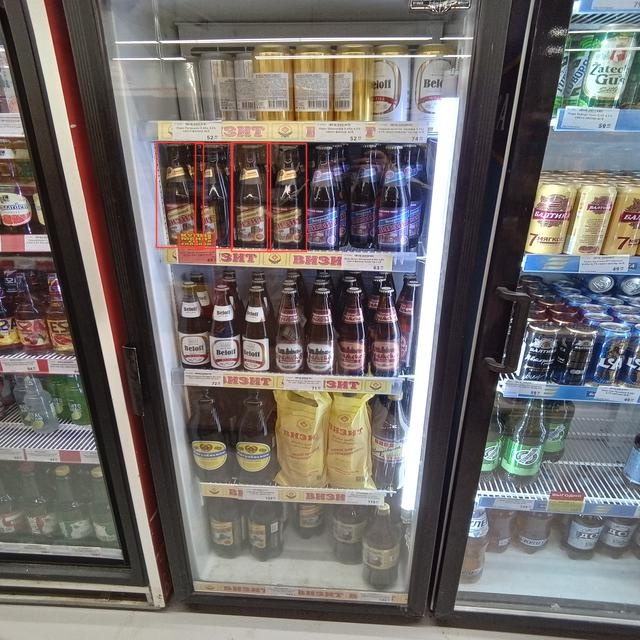

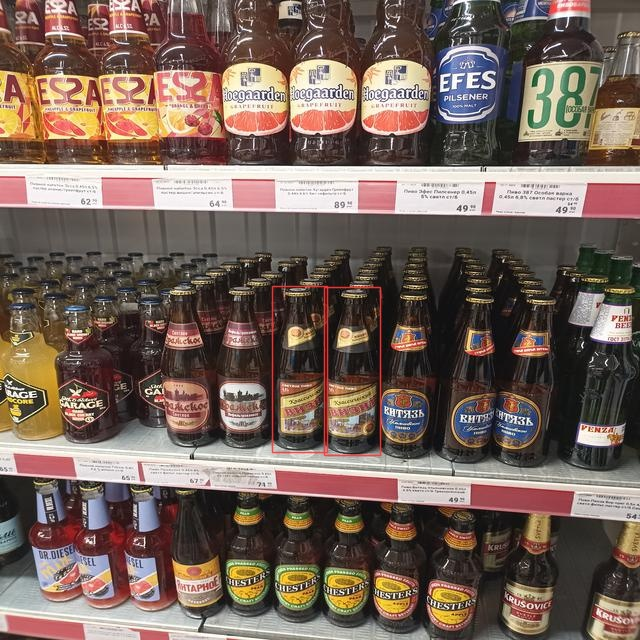

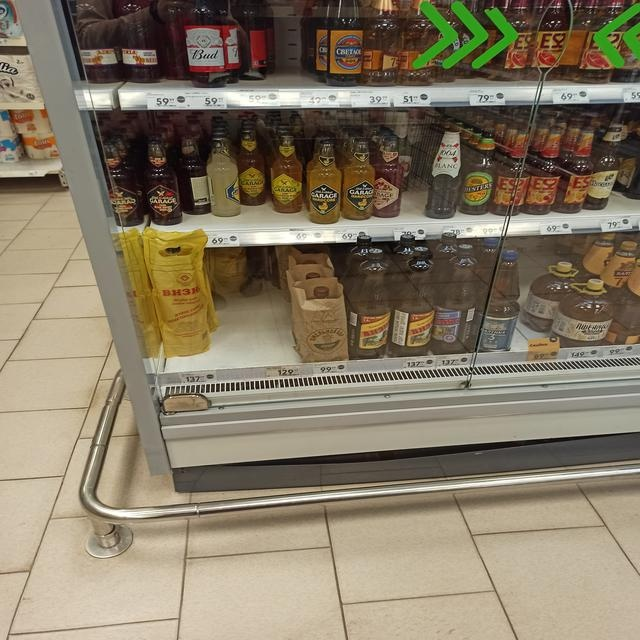

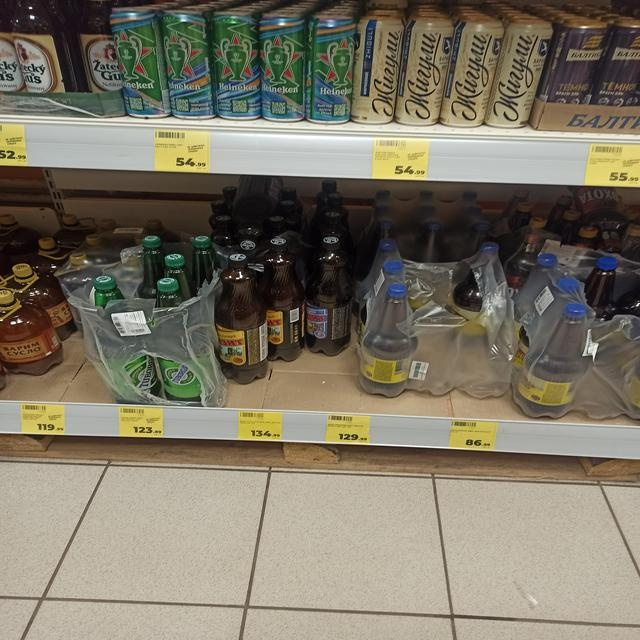

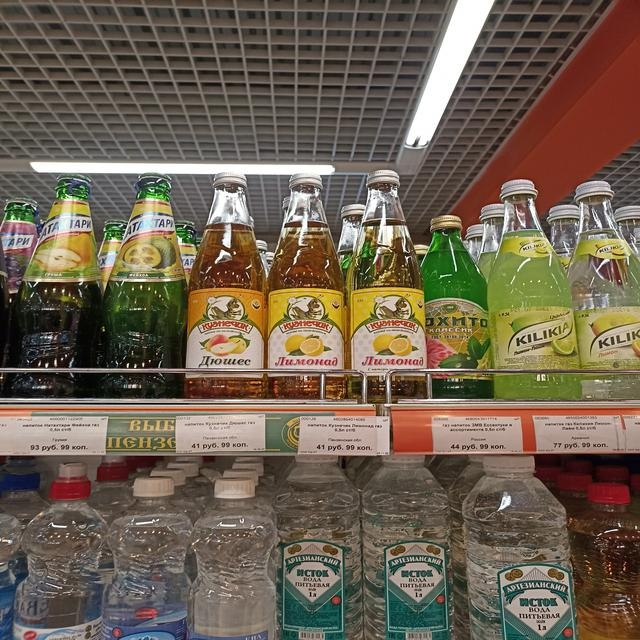

...

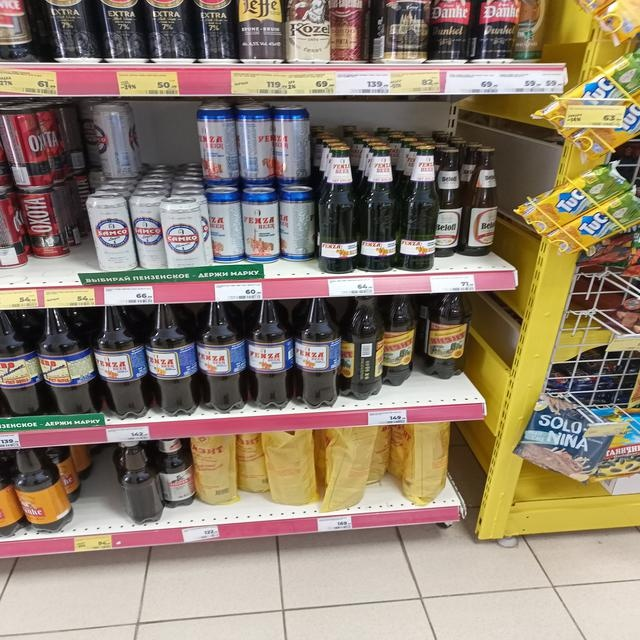

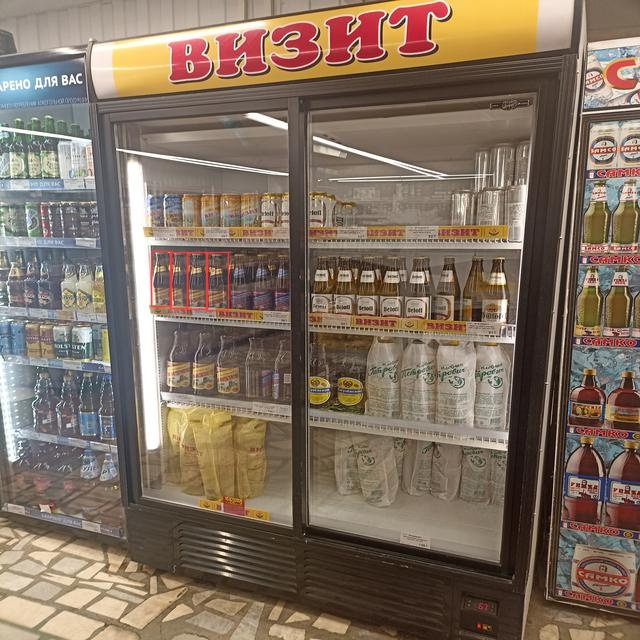

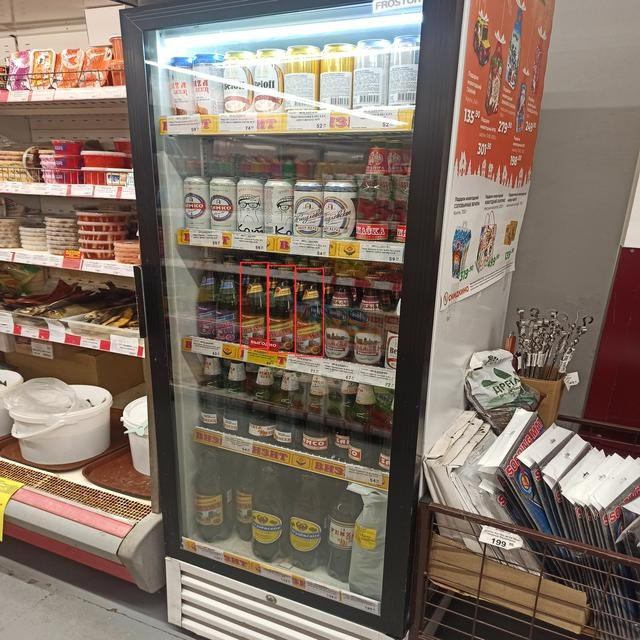

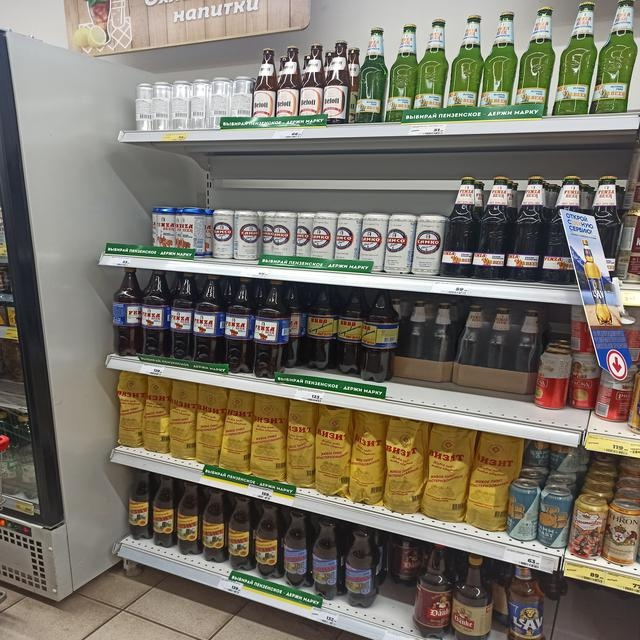

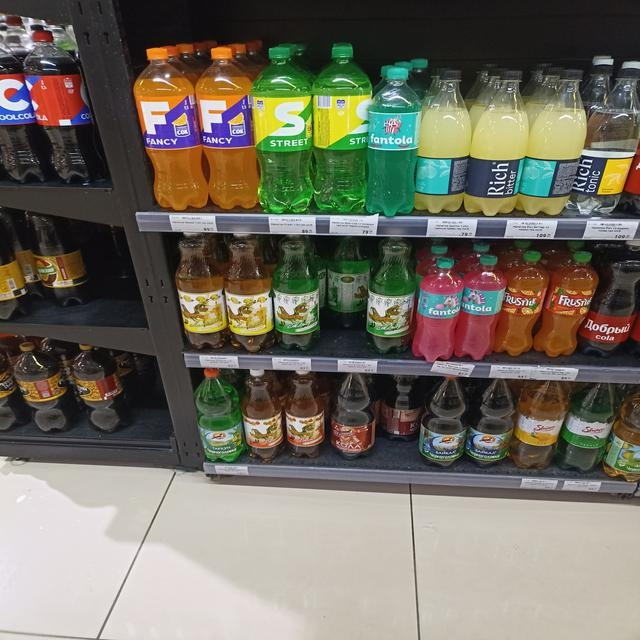

In [ ]:
# вывод инференса всех тестовых изображений
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Новый раздел